# 0. Import library
## 0.1. import public python library

In [1]:
# 0. Import

import numpy as np
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')


import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd

In [2]:
%config InlineBackend.figure_format = 'retina'

plt.rcParams['figure.figsize'] = (20,10)
plt.rcParams["savefig.dpi"] = 600


## 0.2. Import custom library

Please install colonycounter before running the scripts below.
You can install colonycounter with the folliong command.

pip install git+https://github.com/morris-lab/Colony-counter.git


In [3]:
# import custom library
from colonycounter import Counter

# 1. Image processing for sample area detection
## 1.1. Load image to initialize Counter object

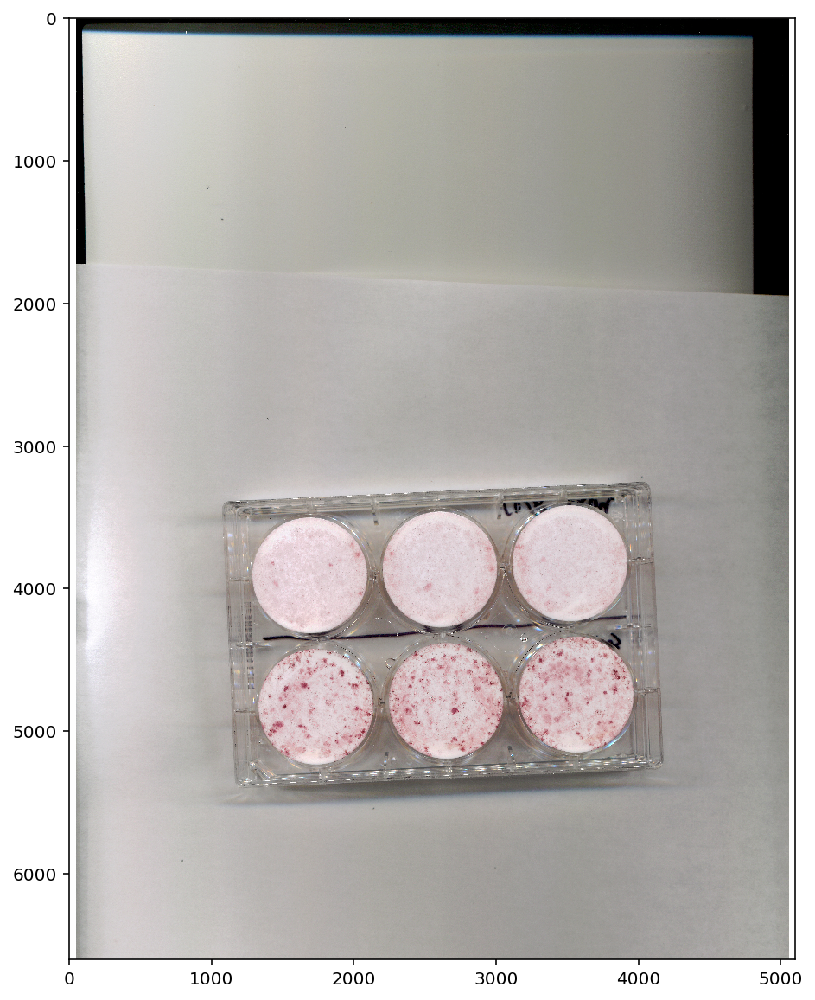

In [4]:
# load image and initialize Counter object
path = "./images.jpg"
counter = Counter(image_path=path)

## 1.2. Detect sample area

detecting sample area...


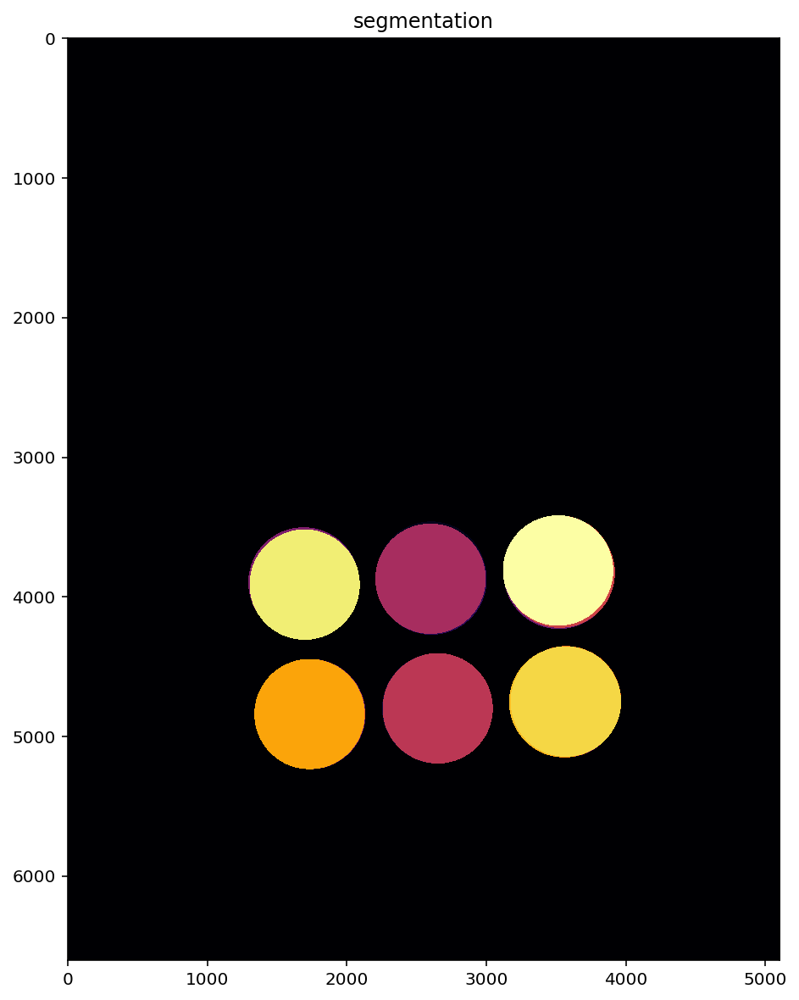

6 samples were detected


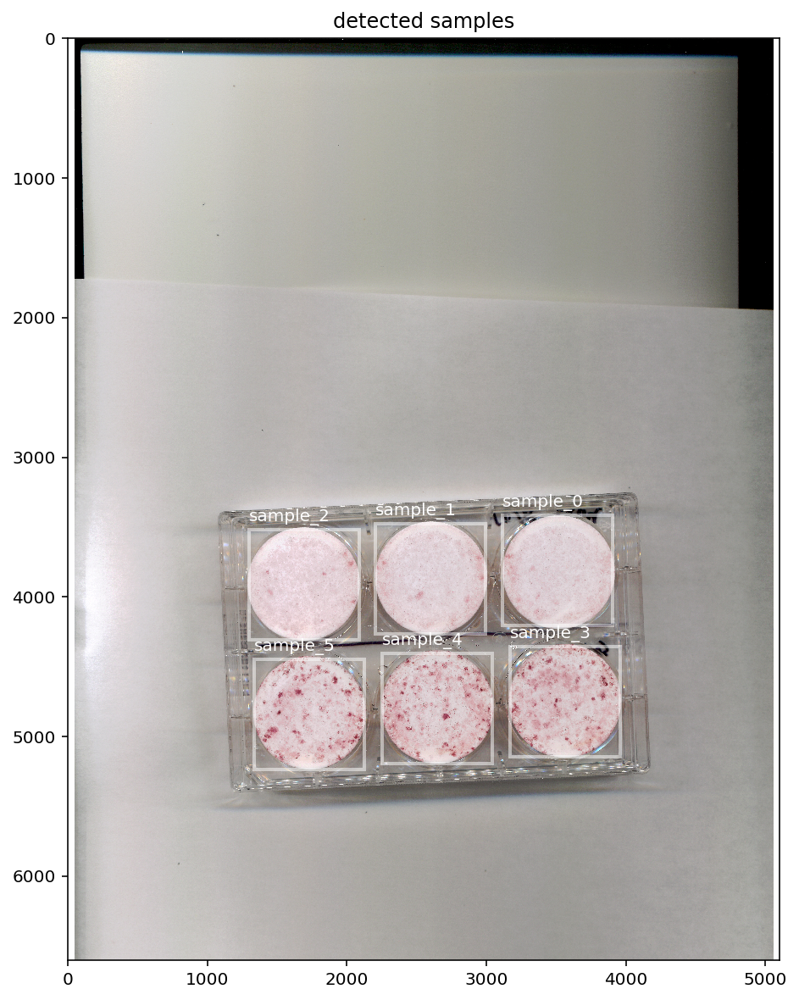

In [5]:
counter.detect_area_by_canny()

## 1.3. (optional) Change sample names

In [7]:
# sample names are stored in "props["names"]"
# these sample name below are generated automatically after sample area detection
counter.props["names"]

['sample_0', 'sample_1', 'sample_2', 'sample_3', 'sample_4', 'sample_5']

In [6]:
### you can change sample names
counter.props["names"] = ["control_1", "control_2", "control_3", "X_1", "X_2", "X_3"]

## 1.4. Crop sample area

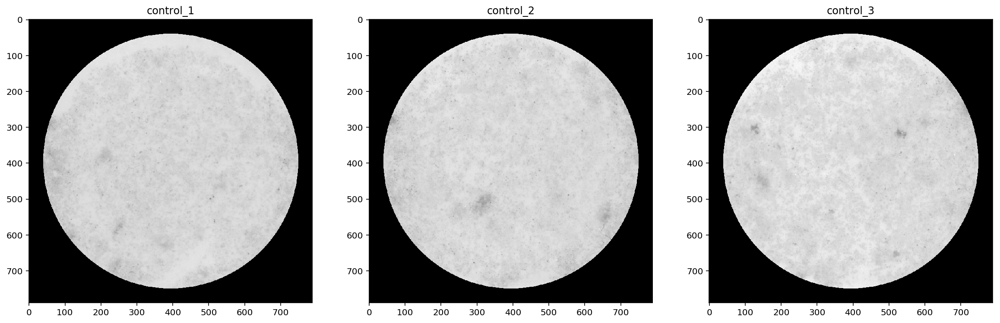

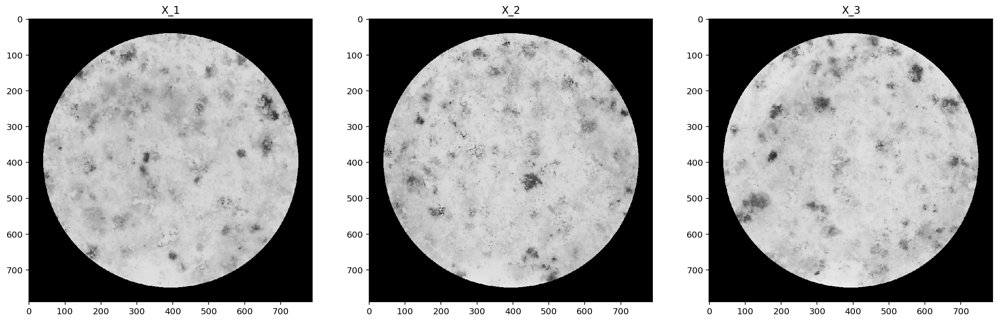

In [7]:
# Crop samplea area in a circle shape.
counter.crop_samples(shrinkage_ratio=0.9)
counter.plot_cropped_samples()

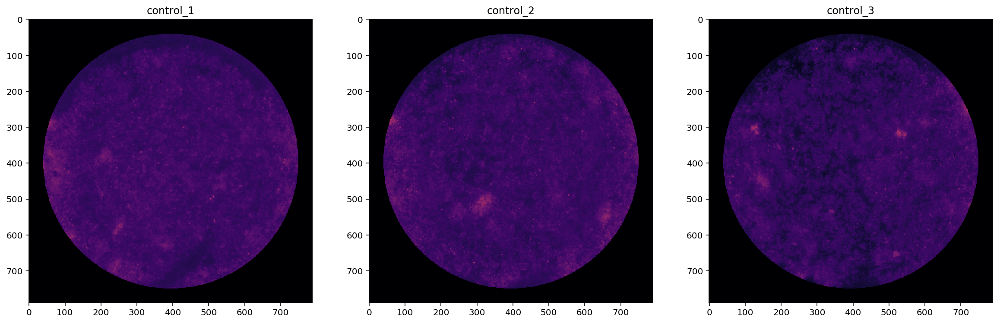

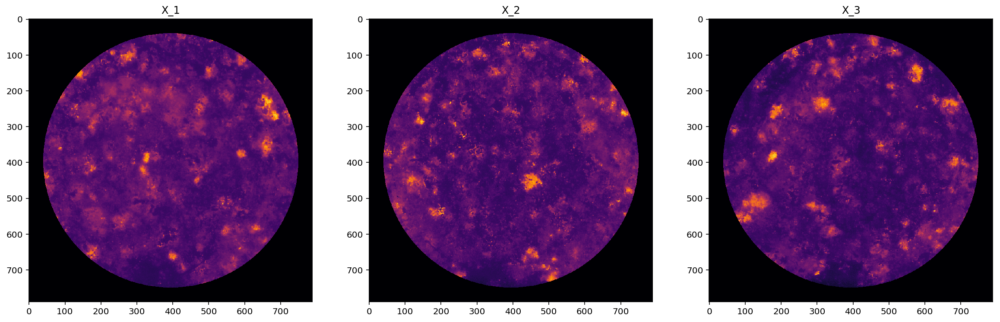

In [8]:
counter.plot_cropped_samples(inverse=True)

# 2. (Optional) Data preprocessing
you can skip these process below if your sample images are clean enough
## 2.1. Background subtraction

In [11]:
#counter.subtract_background()

## 2.2. Contrast adjustment

In [12]:
#counter.adjust_contrast()

# 3. Colony detection

Please try the function below with various parameters searching for most appropriate.
It is important to enter appropriate parameters to get a correct quantification result.

min_size (int, float) : minimum colony size.

max_size (int, float) : maximum colony size.

threshold (float) : threshold for local contrast signal intensity. You will get more colony if you decrease this value.


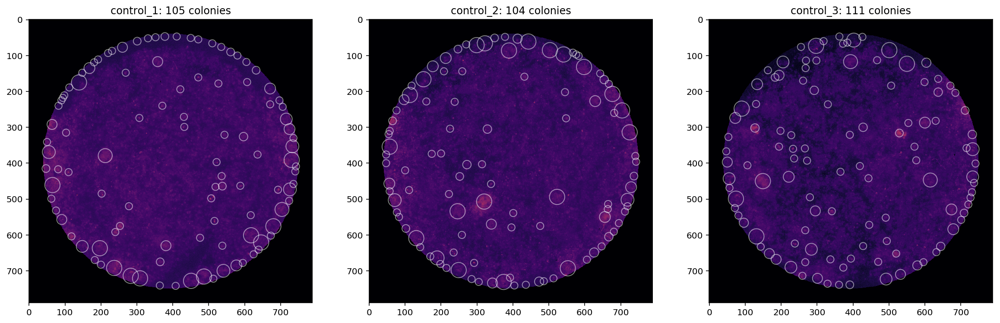

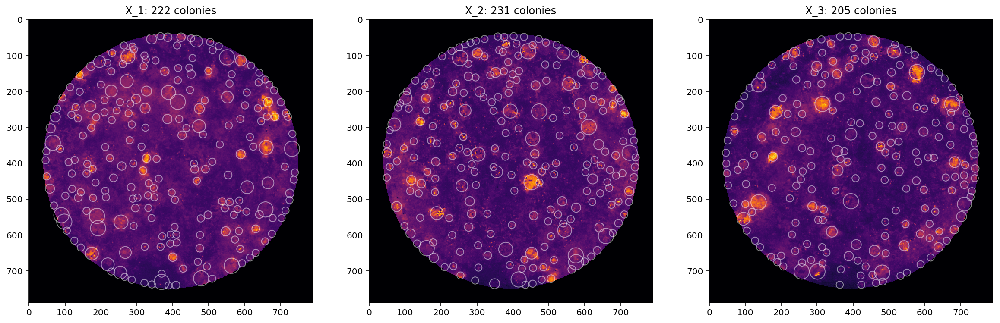

In [9]:
counter.detect_colonies(min_size=7, max_size=15, threshold=0.025, verbose=True)

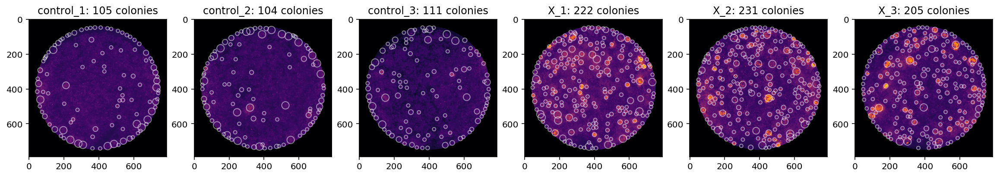

In [11]:
# You can save results as png
counter.plot_detected_colonies(plot="raw_inversed", col_num=6, save="results_inversed")

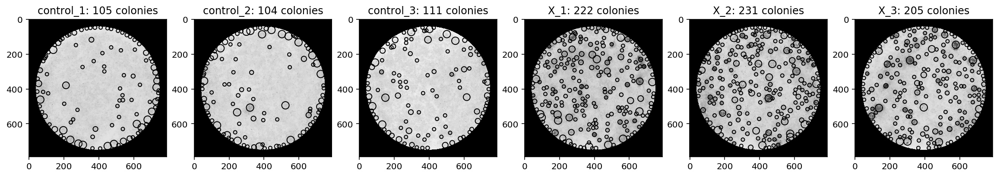

In [14]:
# You can save results as png
counter.plot_detected_colonies(plot="raw", col_num=6, save="results_white_black")


# 4. Get quantification results

In [20]:
# you can get colony information. x and y are cordinates in cropped sample image
colony_detailed_info = counter.quantification_results
colony_detailed_info.head()

,x,y,radius,sample
0,742.0,408.0,9.899495,control_1
1,741.0,364.0,9.899495,control_1
2,728.0,451.0,21.213203,control_1
3,722.0,513.0,9.899495,control_1
4,721.0,309.0,21.213203,control_1


In [21]:
# you can get colony count 
colony_count = counter.quantification_summary
colony_count

,colony_count
sample,
X_1,222
X_2,231
X_3,205
control_1,105
control_2,104
control_3,111


In [22]:
colony_count.to_csv("summary.csv")

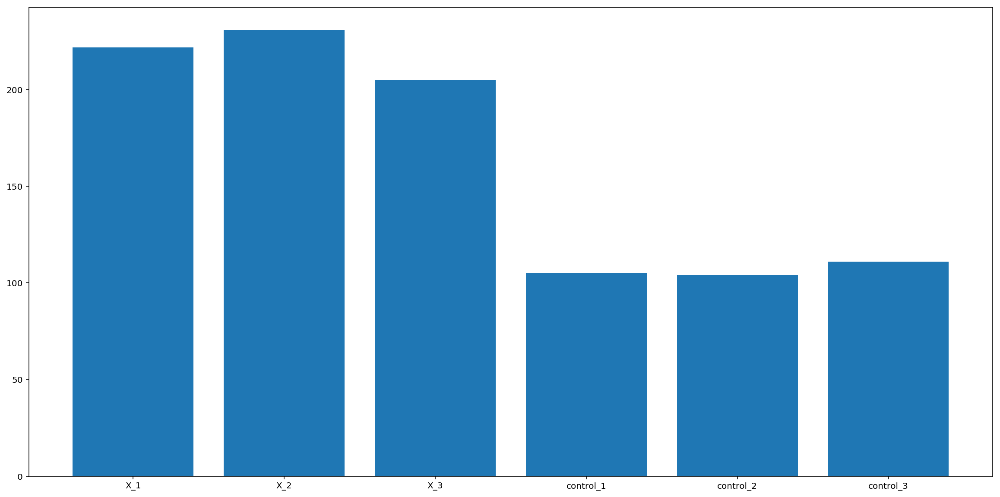

In [25]:
# visualize in bargraph
x = colony_count.index
y = colony_count.colony_count
plt.bar(x, y)

plt.show()